In [4]:
import os

# os.environ["XFORMERS_DISABLED"] = "1"
import sys
from pathlib import Path

SCRIPT_DIR = Path(os.getcwd())  # Sets SCRIPT_DIR to the notebook's directory
print("SCRIPT_DIR:", SCRIPT_DIR)

# Add the neural_networks directory to sys.path for importing modules
sys.path.append(os.path.expanduser('~/projects/astroNNomy/src/astronnomy/training/'))
print("Updated sys.path:", sys.path)
from astronnomy.training.train_nn import *
from source_dataloader import get_dataloaders_source
from torchvision.transforms.functional import hflip, gaussian_blur
from torchvision.transforms import Resize, CenterCrop, RandomRotation, Compose
from torchvision.transforms.v2 import functional as F, Transform
torch.set_float32_matmul_precision('high')
import copy
import matplotlib.pyplot as plt
import cv2
from sklearn.decomposition import PCA, KernelPCA
from sklearn.preprocessing import MinMaxScaler
from sklearn.manifold import TSNE
from sklearn.cluster import KMeans, DBSCAN
from scipy.spatial.distance import cdist
from math import ceil
os.environ["XFORMERS_DISABLED"] = "1"
import numpy as np

SCRIPT_DIR: /gpfs/home2/larsve/projects/astroNNomy/tests
Updated sys.path: ['/sw/arch/RHEL9/EB_production/2024/software/Python/3.12.3-GCCcore-13.3.0/lib/python312.zip', '/sw/arch/RHEL9/EB_production/2024/software/Python/3.12.3-GCCcore-13.3.0/lib/python3.12', '/sw/arch/RHEL9/EB_production/2024/software/Python/3.12.3-GCCcore-13.3.0/lib/python3.12/lib-dynload', '', '/home/larsve/projects/lofar_venv/lib/python3.12/site-packages', '/home/larsve/projects/lofar_venv/lib/python3.12/site-packages/setuptools/_vendor', '/scratch-local/larsve.11611174/tmpyjofu809', '/home/larsve/projects/astroNNomy/src/astronnomy/training/']


In [5]:
class Rotate90Transform:
    def __init__(self, angles=[0, 90, 180, 270]):
        self.angles = angles

    def __call__(self, x):
        angle = np.random.choice(self.angles)
        return v2.functional.rotate(x, int(angle), InterpolationMode.BILINEAR)

    def __repr__(self):
        attrs = ", ".join(f"{k}={v}" for k, v in self.__dict__.items())
        return f"{self.__class__.__name__}({attrs})"



class RotateAndCrop(nn.Module):
    def __init__(self, rotate=True, crop=True):
        super().__init__()
        self.rotate = rotate
        self.crop = crop
        self.max_crop_factor = np.sqrt(2)

    def forward(self, x):
        angle = 0
        if self.rotate:
            angle = np.random.uniform(-180, 180)
            
            x = v2.functional.rotate(x, angle, InterpolationMode.BILINEAR)
            angle = 45

        print(angle)

        if self.crop:
            angle_rad = np.deg2rad(angle)
            *_, h, w = x.shape
            # Compute the factor with which the image needs to be cropped to perfectly fit the largest possible square
            min_crop_factor = abs(np.cos(angle_rad)) + abs(np.sin(angle_rad))
            print(min_crop_factor)

            crop_size = int(
                min(h, w) / np.random.uniform(min_crop_factor, self.max_crop_factor)
            )

            x = v2.functional.center_crop(x, crop_size)


        return x
    
    def __repr__(self):
        return f"{self.__class__.__name__}(rotate={self.rotate}, crop={self.crop})"



class ResizeAndNoise(nn.Module):
    def __init__(self, resize=0):
        super().__init__()
        self.resize = resize

    def forward(self, x):
        *_, h, w = x.shape
        resize_factor = self.resize / max(h, w)
        sigma = 0.5 * resize_factor
        x = x + torch.randn_like(x) * sigma
        x = interpolate(
            x,
            size=(int(h * resize_factor), int(w * resize_factor)),
            mode="bilinear",
            align_corners=False,
        )
        return x
    
    def __repr__(self):
        return f"{self.__class__.__name__}(resize={self.resize})"


class RandomResizeAndNoise(nn.Module):
    def __init__(self, resize_min=0, resize_max=0):
        super().__init__()
        self.sizes = list(range(resize_min, resize_max + 1, 56))

    def forward(self, x):
        *_, h, w = x.shape
        size = np.random.choice(self.sizes)
        print(size)
        resize_factor = size / h
        sigma = 0.5 * resize_factor
        x = x + torch.randn_like(x) * sigma
        x = interpolate(
            x,
            size=(size, size),
            mode="bilinear",
            align_corners=False,
        )
        return x
    
    def __repr__(self):
        return f"{self.__class__.__name__}(sizes={self.sizes})"



In [6]:
def get_transforms(
    rotations: str = "none",
    crop: bool = False,
    resize: int = 0,
    resize_min: int = 0,
    resize_max: int = 0,
    mean: float = 0,
    std: float = 1,
):

    transforms = [v2.Normalize(mean=mean, std=std)]

    if rotations == "orthogonal":
        transforms.append(Rotate90Transform())
    elif rotations == "continuous" or crop:
        transforms.append(RotateAndCrop(rotate=rotations == "continuous", crop=crop))

    if resize:
        transforms.append(ResizeAndNoise(resize))
    elif resize_min and resize_max:
        transforms.append(RandomResizeAndNoise(resize_min, resize_max))

    if rotations != "none":
        transforms.append(v2.RandomHorizontalFlip(p=0.5))
    return v2.Compose(transforms)

In [48]:
train_loader, val_loader = get_dataloaders("/scratch-shared/CORTEX/public.spider.surfsara.nl/lofarvwf/jdejong/CORTEX/calibrator_selection_robertjan/cnn_data/",
        8)

mean, std = train_loader.dataset.compute_statistics(1)

transforms = get_transforms(rotations='continuous', crop=True, resize=0, resize_min=224, resize_max=786, mean=mean, std=std)






In [38]:
print(transforms)

Compose(
      Normalize(mean=[tensor(0.3574, dtype=torch.bfloat16)], std=[tensor(0.1396, dtype=torch.bfloat16)], inplace=False)
      RotateAndCrop(rotate=True, crop=True)
      RandomResizeAndNoise(sizes=[224, 280, 336, 392, 448, 504, 560, 616, 672, 728, 784])
      RandomHorizontalFlip(p=0.5)
)


In [39]:
from torchvision.transforms import v2

rotate = v2.RandomRotation((44, 45))

transforms2 = [lambda x: x.clone(), v2.Resize(224), v2.CenterCrop((1024, 1024)), lambda x: v2.CenterCrop((1442, 1442))(rotate(x))]

0.34083807 0.1405069 0.90234375 0.0
0.34083223 0.034642458 0.8515625 0.19042969
0.34104052 0.14218433 0.90234375 0.0036621094
0.34088615 0.14135624 0.90234375 0.0046081543
0.439949 0.14426732 1.0 0.0
0.4399414 0.08482119 1.0 0.03125
0.42305487 0.18363808 1.0 0.0
0.431601 0.16325389 1.0 0.00015258789
0.34095967 0.14085816 0.87109375 0.0
0.3409617 0.04253443 0.85546875 0.17089844
0.34607422 0.14491226 0.87109375 0.002456665
0.34294277 0.142371 0.87109375 0.0053710938
0.34861362 0.14038709 0.91015625 0.0
0.3486084 0.03474216 0.859375 0.21289062
0.34968257 0.14097227 0.91015625 0.0
0.34893698 0.14074343 0.91015625 0.0


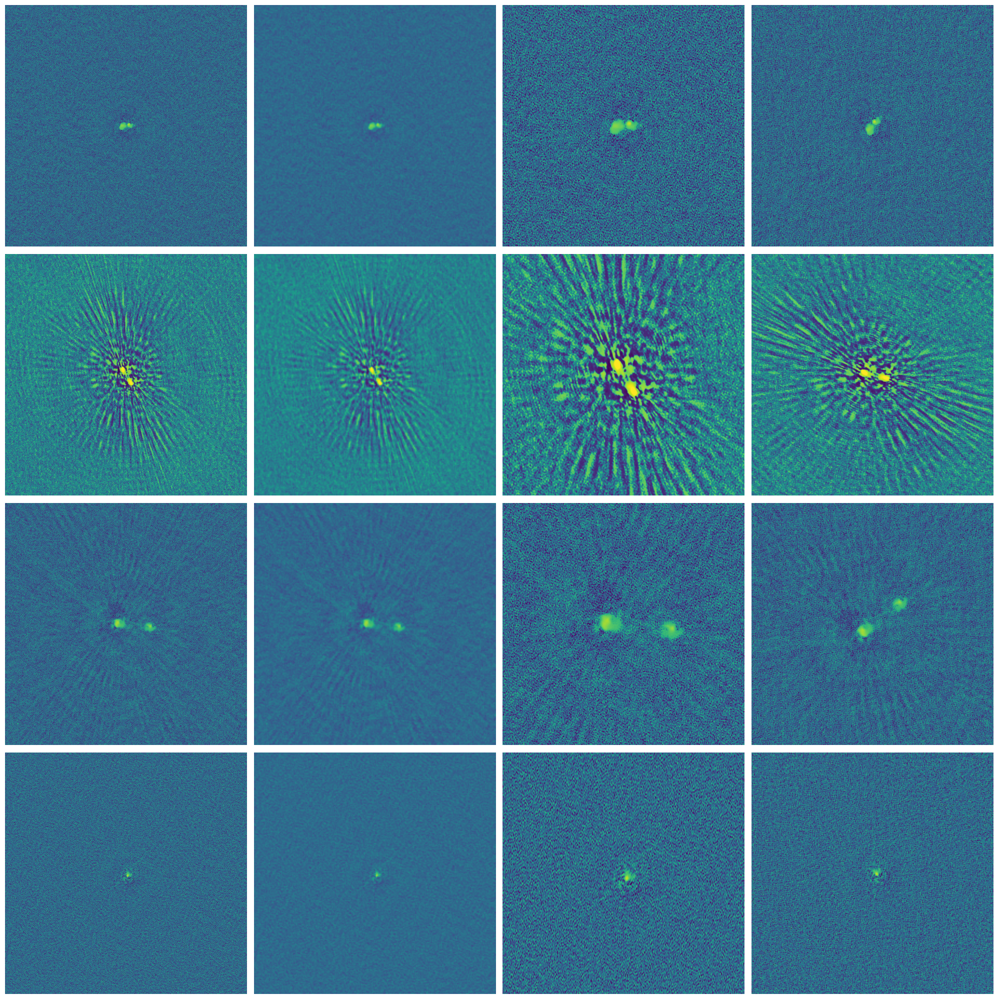

In [51]:
for img, label in train_loader:
    img = img.to('cuda')
    fig, axes = plt.subplots(4, 4, figsize=(20, 20))
    for i, im in enumerate(img[:4]):
        for k, transform in enumerate(transforms2):
            kip = transform(im).clone().detach().cpu().to(torch.float32).numpy().squeeze()
            print(kip.mean(), kip.std(), kip.max(), kip.min())
            axes[i, k].imshow(kip, vmin=0, vmax=1)
            axes[i, k].axis('off')
    plt.tight_layout()
    plt.show()

    break


In [23]:
for img, label in val_loader:
    transformed = transforms(img.to('cuda')).detach().cpu().to(torch.float32).numpy()
    fig, axes = plt.subplots(2, 4, figsize=(20, 10))


    
    for i in range(len(img[:4])):
        # Original image
        axes[0, i].imshow(img[i].cpu().to(torch.float32).numpy().transpose(1, 2, 0))
        axes[0, i].axis('off')
        # Transformed imagetransformed
        axes[1, i].imshow(transformed[i].transpose(1, 2, 0))
        axes[1, i].axis('off')
        
    plt.show()

TypeError: 'list' object is not callable